<a href="https://colab.research.google.com/github/sooin5414/Kaggle/blob/main/CareerVillage_org.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline         #only apply for colab, plt.show()를 호출하지 않아도 그래프가 자동으로 출력
import seaborn as sns
sns.set_palette("Set2")    #그래프에서 사용할 색상 테마를 "Set2" 팔레트로 설정하는 코드
from wordcloud import WordCloud, STOPWORDS  #WordCloud ; 단어구름(워드 클라우드)를 생성하는데 사용되는 라이브러리, STOPWORDS : 불필요한 단어("the", "and", "is"등)을 자동으로 제거하기 위한 목록 제공

In [ ]:
#load dataset, 데이터 받기
questions = pd.read_csv('questions.csv')
answers = pd.read_csv('answers.csv')
students = pd.read_csv('students.csv')
professionals = pd.read_csv('professionals.csv')

In [ ]:
students

,students_id,students_location,students_date_joined
0,12a89e96755a4dba83ff03e03043d9c0,NaN,2011-12-16 14:19:24 UTC+0000
1,e37a5990fe354c60be5e87376b08d5e3,NaN,2011-12-27 03:02:44 UTC+0000
2,12b402cceeda43dcb6e12ef9f2d221ea,NaN,2012-01-01 05:00:00 UTC+0000
3,a0f431fc79794edcb104f68ce55ab897,NaN,2012-01-01 05:00:00 UTC+0000
4,23aea4702d804bd88d1e9fb28074a1b4,NaN,2012-01-01 05:00:00 UTC+0000
...,...,...,...
30966,1154f74f4ac14aaf8ef1b15cdda2b84f,"Ottumwa, Iowa",2019-01-31 19:13:15 UTC+0000
30967,008c7ebabbdf4e7382870d172e6e6691,"Ottumwa, Iowa",2019-01-31 19:14:18 UTC+0000
30968,c445148b5fc8472da00f50b86dfd8faa,"Heckmondwike, England, United Kingdom",2019-01-31 21:04:31 UTC+0000
30969,44b3515e25454cfb80ed1df3a2a23f61,"Clermont, Florida",2019-01-31 22:29:57 UTC+0000


In [ ]:
professionals.head()

,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,9ced4ce7519049c0944147afb75a8ce3,NaN,NaN,NaN,2011-10-05 20:35:19 UTC+0000
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,NaN,NaN,NaN,2011-10-05 20:49:21 UTC+0000
2,0c673e046d824ec0ad0ebe012a0673e4,"New York, New York",NaN,NaN,2011-10-18 17:31:26 UTC+0000
3,977428d851b24183b223be0eb8619a8c,"Boston, Massachusetts",NaN,NaN,2011-11-09 20:39:29 UTC+0000
4,e2d57e5041a44f489288397c9904c2b2,NaN,NaN,NaN,2011-12-10 22:14:44 UTC+0000


In [ ]:
answers

,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14 UTC+0000,<p>Hi!</p>\n<p>You are asking a very interesti...
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08 UTC+0000,<p>Hi. I joined the Army after I attended coll...
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02 UTC+0000,"<p>Dear Priyanka,</p><p>Greetings! I have answ..."
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47 UTC+0000,<p>I work for a global company who values high...
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33 UTC+0000,I agree with Denise. Every single job I've had...
...,...,...,...,...,...
51118,74d708859d7e4d8c9d330506733e1fc3,b08b41c9e3724b609930779875b6b284,b64ef9cf0d33475ca9c22bdb8749f5a8,2016-10-01 08:42:28 UTC+0000,<p>Careers in law enforcement have different r...
51119,2070acba9f89433fa7dd9bcdc5f12351,f1ca9370286248aba5aae737f92a07dd,1b1ebe9afc5046ccbb328704e88e5cc0,2015-10-22 00:06:49 UTC+0000,<p>Well straight up I'm going to tell you it's...
51120,322bc9269c47467cbbee4f2b6b685ae2,9798c8df06244283ba14d30978ec318a,1b1ebe9afc5046ccbb328704e88e5cc0,2015-10-21 21:52:17 UTC+0000,"<p>When I was in my late thirties, with a bach..."
51121,e554bc001ece4cda9ef9524a83239fbc,597cd583fb1049deb9b68ce308a992a8,1b1ebe9afc5046ccbb328704e88e5cc0,2015-10-21 20:22:39 UTC+0000,<p>I dont think age is a criteria at all. Expe...


In [ ]:
questions

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26 UTC+0000,Teacher career question,What is a maths teacher? what is a ma...
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25 UTC+0000,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38 UTC+0000,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32 UTC+0000,To become a specialist in business management...,i hear business management is a hard way to ge...
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54 UTC+0000,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...
...,...,...,...,...,...
23926,ce1ff7a035d74721a5b7d21105f9ddb6,c1c6e6a8c9df4c02af52eda6fa0c552f,2016-04-07 01:08:59 UTC+0000,What is a computer engineer & a computer progr...,<p>I want to know which one is better to do an...
23927,7df38c9ded4a4474bb4f9c1f659e1ad1,6ab792d625e14eb2abc14f9a57a450aa,2015-01-26 17:44:44 UTC+0000,What major do I need to study to be a writer,I am a high school junior and for awhile now I...
23928,63c89317413046f483020585f0cc8dc4,977428d851b24183b223be0eb8619a8c,2011-11-09 20:42:47 UTC+0000,Which careers are good if I enjoy working with...,"I have been volunteering, and I have found tha..."
23929,b64ef9cf0d33475ca9c22bdb8749f5a8,82cc74c0e18347e4b68b219e250eb10f,2016-05-28 03:08:07 UTC+0000,How can going to college help me advance my ca...,I am thinking about a career in law enforcemen...


student's with particular questions

In [ ]:
student_question = students.merge(right=questions, how='inner', left_on='students_id', right_on='questions_author_id')
#students_id랑 quesitons_author_id가 inner(같은값만) merge 병합되는 것

In [ ]:
student_question.T

,0,1,2,3,4,5,6,7,8,9,...,23791,23792,23793,23794,23795,23796,23797,23798,23799,23800
students_id,12a89e96755a4dba83ff03e03043d9c0,5bdd2eb44dd944a9a7ab9aba068d1ef2,9658267bc2564a85bad1e802de5fb597,7b1900c458e34573bfeb0d57ffbd260a,e9efc4d6e06e49c7ae5afe1aad8c5bd5,606c4a5189d943cea3cb79ba2e8a1b20,2611b386835f498181db109b0e1f9323,fae3c431698a418882c4204e5f3ee244,fae3c431698a418882c4204e5f3ee244,fae3c431698a418882c4204e5f3ee244,...,965f3afe66b3453dba0366ea28ccc3a0,965f3afe66b3453dba0366ea28ccc3a0,965f3afe66b3453dba0366ea28ccc3a0,1154f74f4ac14aaf8ef1b15cdda2b84f,1154f74f4ac14aaf8ef1b15cdda2b84f,1154f74f4ac14aaf8ef1b15cdda2b84f,008c7ebabbdf4e7382870d172e6e6691,008c7ebabbdf4e7382870d172e6e6691,c445148b5fc8472da00f50b86dfd8faa,44b3515e25454cfb80ed1df3a2a23f61
students_location,NaN,NaN,"Wayne, Pennsylvania",NaN,NaN,NaN,NaN,"Lakewood, Ohio","Lakewood, Ohio","Lakewood, Ohio",...,"Fremont, Iowa","Fremont, Iowa","Fremont, Iowa","Ottumwa, Iowa","Ottumwa, Iowa","Ottumwa, Iowa","Ottumwa, Iowa","Ottumwa, Iowa","Heckmondwike, England, United Kingdom","Clermont, Florida"
students_date_joined,2011-12-16 14:19:24 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,...,2019-01-31 19:10:36 UTC+0000,2019-01-31 19:10:36 UTC+0000,2019-01-31 19:10:36 UTC+0000,2019-01-31 19:13:15 UTC+0000,2019-01-31 19:13:15 UTC+0000,2019-01-31 19:13:15 UTC+0000,2019-01-31 19:14:18 UTC+0000,2019-01-31 19:14:18 UTC+0000,2019-01-31 21:04:31 UTC+0000,2019-01-31 22:29:57 UTC+0000
questions_id,057e9dcc3c7e4b93825170808839e08a,e478483c7bcf4687b1acef20453e50a9,c177a08b702d4f2a8f9f77ebaf023ebe,95b06f6b474d4335bcd5e15396f117bc,1b12367c556346c4a053de4e5ab0f6fa,14e3cc02accf48f4bbfafe1697f6c553,7ef88ccdd78442fcb7d96745c8221c6c,745659e790094192bde6c6ef81e3ce1d,585833caefe84e15a0276710632a96e2,a14e9100a0444e159f59e71b016a60ee,...,198d9f0de25b4be7ace65cd3e39eacd0,473bc96a9c5646c3a464607fb66c296f,e15ceba461654b75bcd21fd49e724dd4,89a93817150f45869dd02aced48f1d89,585c2e18438d431e8976340d6e39d5c7,1f065628f6d148c3a4bd4b0eb42f2bc9,9fe651526385412fa8c9d8a817825ff7,0f5f365b7f0f4959aee65dadf0e3d2db,333e06afdb0048d19c126ce02f673a89,8ea56755f5c849099bcb85735e042865
questions_author_id,12a89e96755a4dba83ff03e03043d9c0,5bdd2eb44dd944a9a7ab9aba068d1ef2,9658267bc2564a85bad1e802de5fb597,7b1900c458e34573bfeb0d57ffbd260a,e9efc4d6e06e49c7ae5afe1aad8c5bd5,606c4a5189d943cea3cb79ba2e8a1b20,2611b386835f498181db109b0e1f9323,fae3c431698a418882c4204e5f3ee244,fae3c431698a418882c4204e5f3ee244,fae3c431698a418882c4204e5f3ee244,...,965f3afe66b3453dba0366ea28ccc3a0,965f3afe66b3453dba0366ea28ccc3a0,965f3afe66b3453dba0366ea28ccc3a0,1154f74f4ac14aaf8ef1b15cdda2b84f,1154f74f4ac14aaf8ef1b15cdda2b84f,1154f74f4ac14aaf8ef1b15cdda2b84f,008c7ebabbdf4e7382870d172e6e6691,008c7ebabbdf4e7382870d172e6e6691,c445148b5fc8472da00f50b86dfd8faa,44b3515e25454cfb80ed1df3a2a23f61
questions_date_added,2011-12-16 14:26:31 UTC+0000,2012-04-16 01:48:26 UTC+0000,2012-01-13 03:33:53 UTC+0000,2012-01-09 07:34:16 UTC+0000,2012-01-26 17:03:01 UTC+0000,2012-01-24 02:16:56 UTC+0000,2012-01-19 04:12:27 UTC+0000,2012-01-25 02:26:13 UTC+0000,2012-01-20 04:14:46 UTC+0000,2012-01-19 21:47:39 UTC+0000,...,2019-01-31 19:18:24 UTC+0000,2019-01-31 19:26:27 UTC+0000,2019-01-31 19:24:17 UTC+0000,2019-01-31 19:16:48 UTC+0000,2019-01-31 19:25:15 UTC+0000,2019-01-31 19:22:28 UTC+0000,2019-01-31 19:30:12 UTC+0000,2019-01-31 19:23:47 UTC+0000,2019-01-31 21:05:44 UTC+0000,2019-01-31 22:32:00 UTC+0000
questions_title,What do magazine editors do?,MSW vs MPH?,What are the skills required to succeed in the...,What are good schools for a Masters in Educati...,Doctor Experiences,What are some majors that are required (or rec...,What are work hours like as a neurosurgeon?,What are some good places for scholarships?,Does the name of your college actually make a .

student's questions with answer

In [ ]:
sq_answers=student_question.merge(right=answers, how='inner', left_on='questions_id', right_on='answers_question_id')

In [ ]:
sq_answers.head(2).T

,0,1
students_id,12a89e96755a4dba83ff03e03043d9c0,12a89e96755a4dba83ff03e03043d9c0
students_location,NaN,NaN
students_date_joined,2011-12-16 14:19:24 UTC+0000,2011-12-16 14:19:24 UTC+0000
questions_id,057e9dcc3c7e4b93825170808839e08a,057e9dcc3c7e4b93825170808839e08a
questions_author_id,12a89e96755a4dba83ff03e03043d9c0,12a89e96755a4dba83ff03e03043d9c0
questions_date_added,2011-12-16 14:26:31 UTC+0000,2011-12-16 14:26:31 UTC+0000
questions_title,What do magazine editors do?,What do magazine editors do?
questions_body,I like popular mechanics and I'd love to work ...,I like popular mechanics and I'd love to work ...
answers_id,a711ac08a1cc4ef3a0a218b719a3a2a9,5d1f883c40574c41929c44e96c51cc81
answers_author_id,4b7737cb8c46400795bdba3a4f333997,f233ae9d0f9e4c419f94900493d747b2


student's questions answered by professionals

In [ ]:
final_df=sq_answers.merge(right=professionals, how='inner', left_on='answers_author_id', right_on='professionals_id')

In [ ]:
final_df.head().T

,0,1,2,3,4
students_id,12a89e96755a4dba83ff03e03043d9c0,12a89e96755a4dba83ff03e03043d9c0,5bdd2eb44dd944a9a7ab9aba068d1ef2,5bdd2eb44dd944a9a7ab9aba068d1ef2,9658267bc2564a85bad1e802de5fb597
students_location,NaN,NaN,NaN,NaN,"Wayne, Pennsylvania"
students_date_joined,2011-12-16 14:19:24 UTC+0000,2011-12-16 14:19:24 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000,2012-01-01 05:00:00 UTC+0000
questions_id,057e9dcc3c7e4b93825170808839e08a,057e9dcc3c7e4b93825170808839e08a,e478483c7bcf4687b1acef20453e50a9,e478483c7bcf4687b1acef20453e50a9,c177a08b702d4f2a8f9f77ebaf023ebe
questions_author_id,12a89e96755a4dba83ff03e03043d9c0,12a89e96755a4dba83ff03e03043d9c0,5bdd2eb44dd944a9a7ab9aba068d1ef2,5bdd2eb44dd944a9a7ab9aba068d1ef2,9658267bc2564a85bad1e802de5fb597
questions_date_added,2011-12-16 14:26:31 UTC+0000,2011-12-16 14:26:31 UTC+0000,2012-04-16 01:48:26 UTC+0000,2012-04-16 01:48:26 UTC+0000,2012-01-13 03:33:53 UTC+0000
questions_title,What do magazine editors do?,What do magazine editors do?,MSW vs MPH?,MSW vs MPH?,What are the skills required to succeed in the...
questions_body,I like popular mechanics and I'd love to work ...,I like popular mechanics and I'd love to work ...,'m interested in earning my MSW because I woul...,'m interested in earning my MSW because I woul...,I am not sure which specific public sector I w...
answers_id,a711ac08a1cc4ef3a0a218b719a3a2a9,5d1f883c40574c41929c44e96c51cc81,076824d804bf42e1b5f67694a667c23f,bf211dd3cd4d480b9ddbadc02b1b38bd,b8321456238e45428e0424a638b553c6
answers_author_id,4b7737cb8c46400795bdba3a4f333997,f233ae9d0f9e4c419f94900493d747b2,a620860fe2e044a2bad3ed0b3ef8637e,54a964c533494a739aeb5d4d1761f3ef,a71fdedfdb8a478cb19f6fdb761da215


answers_id : 49723개의 질문 데이터가 있는데 고유한 답변아이디도 49723개 즉 모든 답변이 고유함(중복없음), 각 답변ID는 단 한번만 등장(freq=1) 모든 답변이 독립적인 데이터

In [ ]:
final_df.describe().T
#count: 해당 열의 있는 값의 개수(NaN제외)
#unique	: 해당 열에서 유일한 값의 개수
#top : 가장 많이 등장한(최빈)값
#freq : top값이 등장한 빈도수
#예를 들어, 학생ID는 49723개의 데이터가 있는데 고유한 학생ID는 11985(일부 학생이 여러개의 질문을 작성함을 의미함), 가장 많이 등장한 ID(top) 306 즉,특정 학생이 306개의 질문을 작성함

,count,unique,top,freq
students_id,49723,11985,867e779f9dad4020925e986151ca4be4,306
students_location,47847,3311,"New York, New York",2042
students_date_joined,49723,11658,2012-01-04 05:00:00 UTC+0000,442
questions_id,49723,22662,8eb6ba7af57846acbfec5633e537192a,58
questions_author_id,49723,11985,867e779f9dad4020925e986151ca4be4,306
questions_date_added,49723,22606,2017-12-08 05:55:32 UTC+0000,58
questions_title,49723,22482,What qualities should I possess if I want to b...,58
questions_body,49723,22434,Accounting student at Towson university #acco...,58
answers_id,49723,49723,a711ac08a1cc4ef3a0a218b719a3a2a9,1
answers_author_id,49723,10015,36ff3b3666df400f956f8335cf53e09e,1703


where most of the student resides
가장 많은 학생들이 거주하는 곳

In [ ]:
final_df['students_location'].fillna("N/A", inplace=True)
#fillna("N/A" : NaN(누락된 값, 즉 결측값)을 "N/A"로 대체(데이터 없음)
#inplace=True : 원본 final_df가 직접 수정됨

In [ ]:
final_df.

,students_id,students_location,students_date_joined,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined
0,12a89e96755a4dba83ff03e03043d9c0,N/A,2011-12-16 14:19:24 UTC+0000,057e9dcc3c7e4b93825170808839e08a,12a89e96755a4dba83ff03e03043d9c0,2011-12-16 14:26:31 UTC+0000,What do magazine editors do?,I like popular mechanics and I'd love to work ...,a711ac08a1cc4ef3a0a218b719a3a2a9,4b7737cb8c46400795bdba3a4f333997,057e9dcc3c7e4b93825170808839e08a,2014-02-13 20:21:01 UTC+0000,"<p>John,</p>\n<p>On a low-level a rank and fil...",4b7737cb8c46400795bdba3a4f333997,"Brockton, Massachusetts",Design,UI/UX designer with management and product dev...,2013-11-13 21:59:35 UTC+0000
1,12a89e96755a4dba83ff03e03043d9c0,N/A,2011-12-16 14:19:24 UTC+0000,057e9dcc3c7e4b93825170808839e08a,12a89e96755a4dba83ff03e03043d9c0,2011-12-16 14:26:31 UTC+0000,What do magazine editors do?,I like popular mechanics and I'd love to work ...,5d1f883c40574c41929c44e96c51cc81,f233ae9d0f9e4c419f94900493d747b2,057e9dcc3c7e4b93825170808839e08a,2014-02-21 20:33:47 UTC+0000,<p>Magazine editors are people who are respons...,f233ae9d0f9e4c419f94900493d747b2,"Tempe, Arizona",Computer Software,Sr. Manager at Linkedin,2014-02-21 20:17:03 UTC+0000
2,5bdd2eb44dd944a9a7ab9aba068d1ef2,N/A,2012-01-01 05:00:00 UTC+0000,e478483c7bcf4687b1acef20453e50a9,5bdd2eb44dd944a9a7ab9aba068d1ef2,2012-04-16 01:48:26 UTC+0000,MSW vs MPH?,'m interested in earning my MSW because I woul...,076824d804bf42e1b5f67694a667c23f,a620860fe2e044a2bad3ed0b3ef8637e,e478483c7bcf4687b1acef20453e50a9,2012-04-18 22:30:10 UTC+0000,"<p>Hello! This is a great question, and I woul...",a620860fe2e044a2bad3ed0b3ef8637e,"Ashburn, Virginia",NaN,NaN,2012-01-30 16:58:51 UTC+0000
3,5bdd2eb44dd944a9a7ab9aba068d1ef2,N/A,2012-01-01 05:00:00 UTC+0000,e478483c7bcf4687b1acef20453e50a9,5bdd2eb44dd944a9a7ab9aba068d1ef2,2012-04-16 01:48:26 UTC+0000,MSW vs MPH?,'m interested in earning my MSW because I woul...,bf211dd3cd4d480b9ddbadc02b1b38bd,54a964c533494a739aeb5d4d1761f3ef,e478483c7bcf4687b1acef20453e50a9,2012-04-18 13:16:55 UTC+0000,"<p>Hi! Great question, and good you're thinkin...",54a964c533494a739aeb5d4d1761f3ef,NaN,NaN,NaN,2012-04-18 12:58:14 UTC+0000
4,9658267bc2564a85bad1e802de5fb597,"Wayne, Pennsylvania",2012-01-01 05:00:00 UTC+0000,c177a08b702d4f2a8f9f77ebaf023ebe,9658267bc2564a85bad1e802de5fb597,2012-01-13 03:33:53 UTC+0000,What are the skills required to succeed in the...,I am not sure which specific public sector I w...,b8321456238e45428e0424a638b553c6,a71fdedfdb8a478cb19f6fdb761da215,c177a08b702d4f2a8f9f77ebaf023ebe,2012-01-15 17:09:20 UTC+0000,"<p>In addition to good communication skills, I...",a71fdedfdb8a478cb19f6fdb761da215,"Oakland, California",NaN,NaN,2012-01-02 05:00:00 UTC+0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49718,0b98b362d0ed493c9e1dcfe068b8ed12,"Slidell, Texas",2019-01-29 21:32:08 UTC+0000,0c3bbf6f7b714e35868b7d26dc74af98,0b98b362d0ed493c9e1dcfe068b8ed12,2019-01-29 21:35:07 UTC+0000,How Can I help my kids decide their future?,I am a study skills teacher from grades 9 - 12...,62833f1093a54a4f9373596f5f8eccf9,90a44c8e7a5848998d93a58f4b702a66,0c3bbf6f7b714e35868b7d26dc74af98,2019-01-30 23:26:20 UTC+0000,<p>Encourage them to explore a lot of differen...,90a44c8e7a5848998d93a58f4b702a66,Greater Minneapolis-St. Paul Area,Non-profit,Community Volunteer,2018-07-05 14:34:12 UTC+0000
49719,0b98b362d0ed493c9e1dcfe068b8ed12,"Slidell, Texas",2019-01-29 21:32:08 UTC+0000,0c3bbf6f7b714e35868b7d26dc74af98,0b98b362d0ed493c9e1dcfe068b8ed12,2019-01-29 21:35:07 UTC+0000,How Can I help my kids decide their future?,I am a study skills teacher from grades 9 - 12...,8e11d744ad744c28a0a7cc6b644b5494,bc01c4d1f8984c709fb5c83b0873146e,0c3bbf6f7b714e35868b7d26dc74af98,2019-01

In [ ]:
final_df['students_location'].values #studnets_location의 값만 보여줘

array(['N/A', 'N/A', 'N/A', ..., 'Slidell, Texas',
       'Leeds, England, United Kingdom', 'Ottumwa, Iowa'], dtype=object)

In [ ]:
all_location = ','.join(final_df['students_location'].values)
all_location

"N/A,N/A,N/A,N/A,Wayne, Pennsylvania,Wayne, Pennsylvania,Wayne, Pennsylvania,Wayne, Pennsylvania,Wayne, Pennsylvania,Wayne, Pennsylvania,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,Lakewood, Ohio,N/A,N/A,N/A,N/A,N/A,N/A,London, Ontario, Canada,London, Ontario, Canada,London, Ontario, Canada,London, Ontario, Canada,N/A,N/A,Burlingame, California,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,N/A,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,San Francisco, California,N/A,N/A,

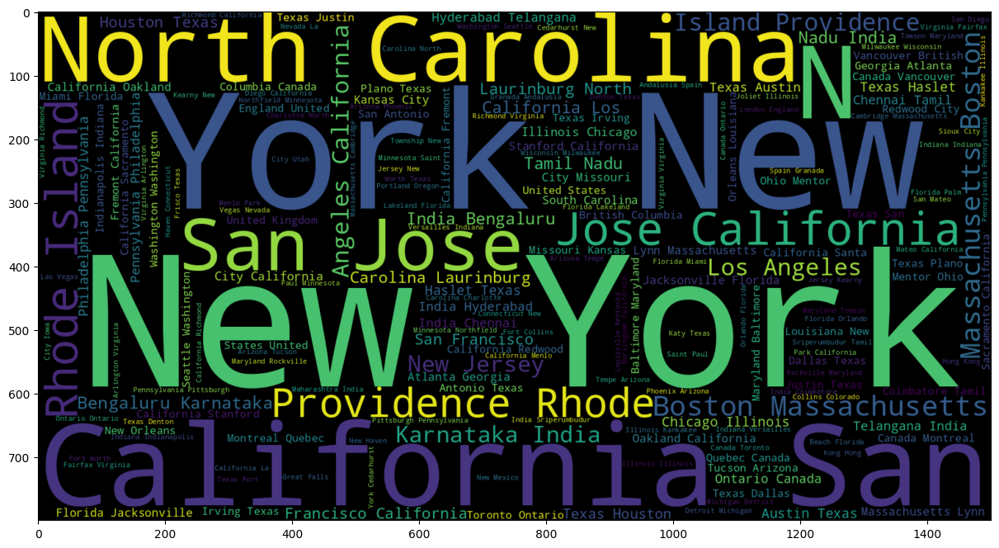

In [ ]:
#wordcloud 사용
wordcloud = WordCloud(width=1500, height=800).generate(all_location) # 자체 해상도를 결정, 값이 클수록 고해상도, 더 많은 단어 포함할수 있음

plt.figure(figsize=(20,8))
plt.imshow(wordcloud, interpolation='bilinear') #픽셀을 부드럽게 보정하는 방법중 하나, bilinear: 곡선이 ㅁ낳은 이미지에서 부드러운 경게를 만들어 이미지가 더 자연스럽게 보임
plt.axis('on') # x축, y축 제거 → 이미지만 보이게 됨
plt.show()

#result = new york, california, north carolina, san jose, los angeles, rhode island

Question's Topics

In [ ]:
final_df['questions_title'].isnull()
#pandas에서 시리지의 결측값(NaN)을 찾는 함수
#결측갑싱 있으면 True, 없으면 False

,questions_title
0,False
1,False
2,False
3,False
4,False
...,...
49718,False
49719,False
49720,False
49721,False


In [ ]:
final_df['questions_title'].isnull().values.any()
#any() : 배열 내 값이 하나라도 True 있으면 True, 모두 False이면 False 반환
#False라면 결측값이 없다!

False

In [ ]:
all_question_titles = ','.join(final_df['questions_title'].values)
all_question_titles

'What do magazine editors do?,What do magazine editors do?,MSW vs MPH?,MSW vs MPH?,What are the skills required to succeed in the nonprofit field?,What are the skills required to succeed in the nonprofit field?,What are the skills required to succeed in the nonprofit field?,What are the skills required to succeed in the nonprofit field?,What are the skills required to succeed in the nonprofit field?,What are the skills required to succeed in the nonprofit field?,What are good schools for a Masters in Education Administration?,What are good schools for a Masters in Education Administration?,What are good schools for a Masters in Education Administration?,Doctor Experiences,What are some majors that are required (or recommended) in order to become a successful accountant?,What are some majors that are required (or recommended) in order to become a successful accountant?,What are some majors that are required (or recommended) in order to become a successful accountant?,What are some major

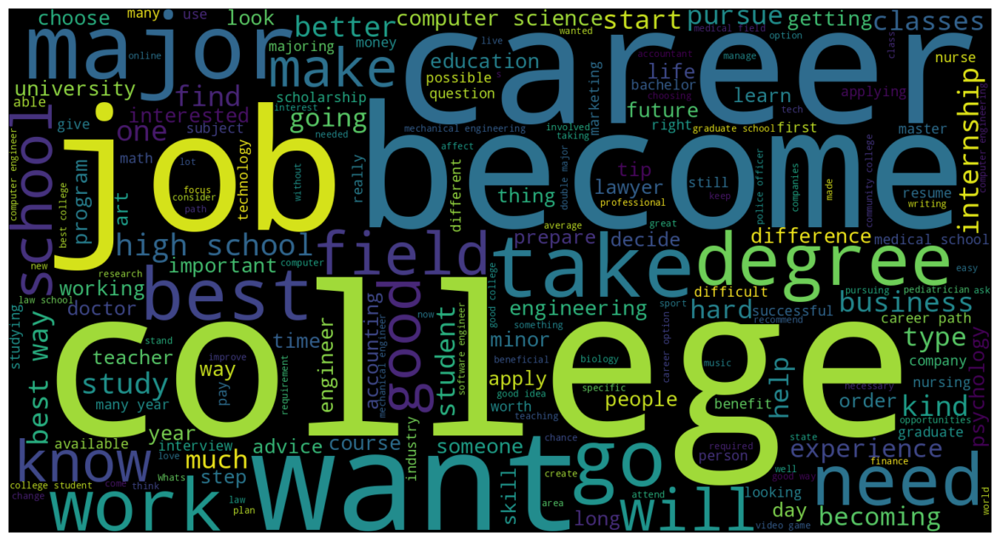

In [ ]:
wordcloud=WordCloud(width=1500, height=800).generate(all_question_titles)

plt.figure(figsize=(20,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()
#college, job, career

Author who answer's most questions

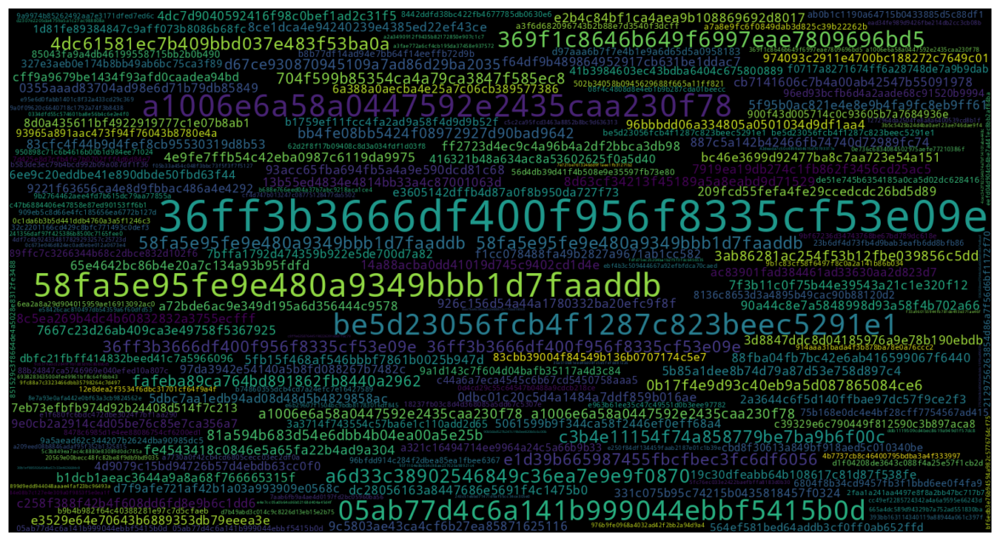

In [ ]:
all_author=','.join(final_df['answers_author_id'].values)

wordcloud=WordCloud(width=1500, height=800).generate(all_author)

plt.figure(figsize=(20,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Where are from the professinals

In [ ]:
final_df['professionals_location'].isnull().values.any()
#true가 나왔음으로 결측치 값이 있다는 말인데...

True

In [ ]:
final_df['professionals_location'].fillna("N/A", inplace=True)

<ipython-input-60-bed79a32f7a9>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  final_df['professionals_location'].fillna("N/A", inplace=True)


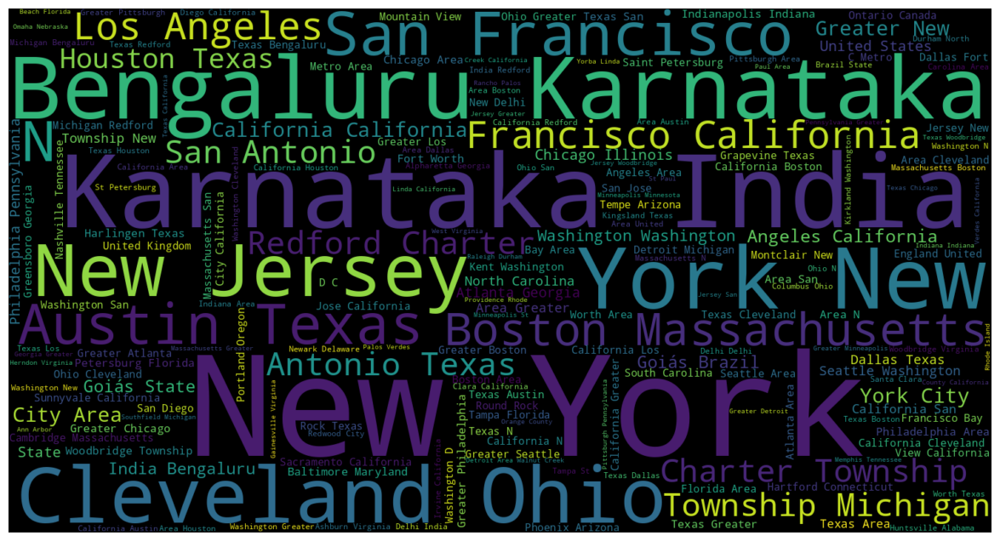

In [ ]:
professionals_locations = ','.join(final_df['professionals_location'].values)

wordcloud = WordCloud(width=1500, height=800).generate(professionals_locations)

plt.figure(figsize=(20,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()
#new york, cleveland ohio, Bengaluru, Karnataka

Most common professinal industry
가장 흖란 산업군을 의미함

In [ ]:
final_df['professionals_industry'].isnull().values.any()

True

In [ ]:
final_df['professionals_industry'].fillna('N/A', inplace=True)

<ipython-input-68-556ff6bca31f>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  final_df['professionals_industry'].fillna('N/A', inplace=True)


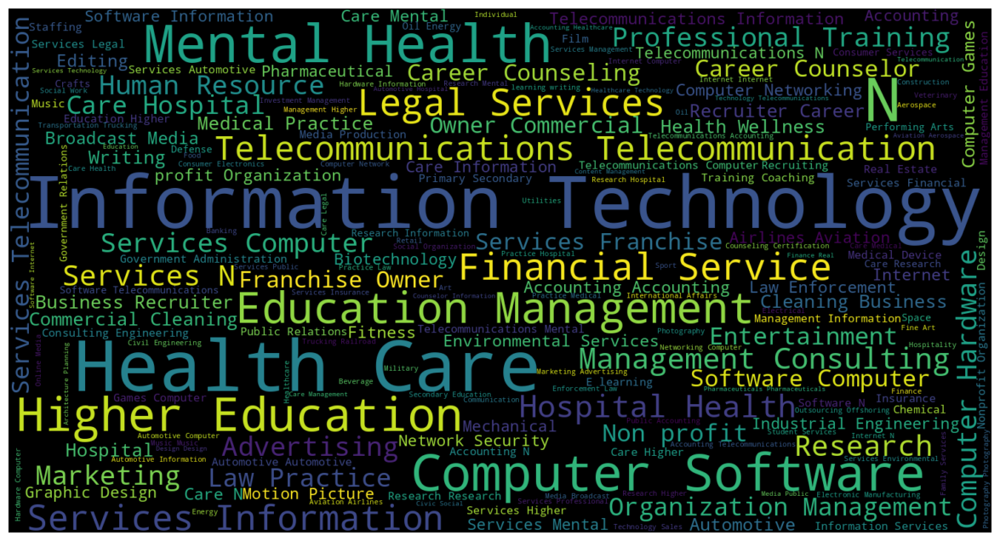

In [ ]:
all_industries= ','.join(final_df['professionals_industry'].values)

wordcloud = WordCloud(width=1500, height=800).generate(all_industries)

plt.figure(figsize=(20,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()
#health care, information technology, mental health, computer software

professinal are from which field?
개별 전문가들이 속한 분야(직종, 학문 분야)를 묻는 질문, 각 전문가가 속한 특정 직업군이나 연구 분야를 의미함


In [ ]:
final_df['professionals_headline'].isnull().values.any()

True

In [ ]:
final_df['professionals_headline'].fillna('N/A', inplace=True)

In [ ]:
professional_fields = ','.join(final_df['professionals_headline'].values)

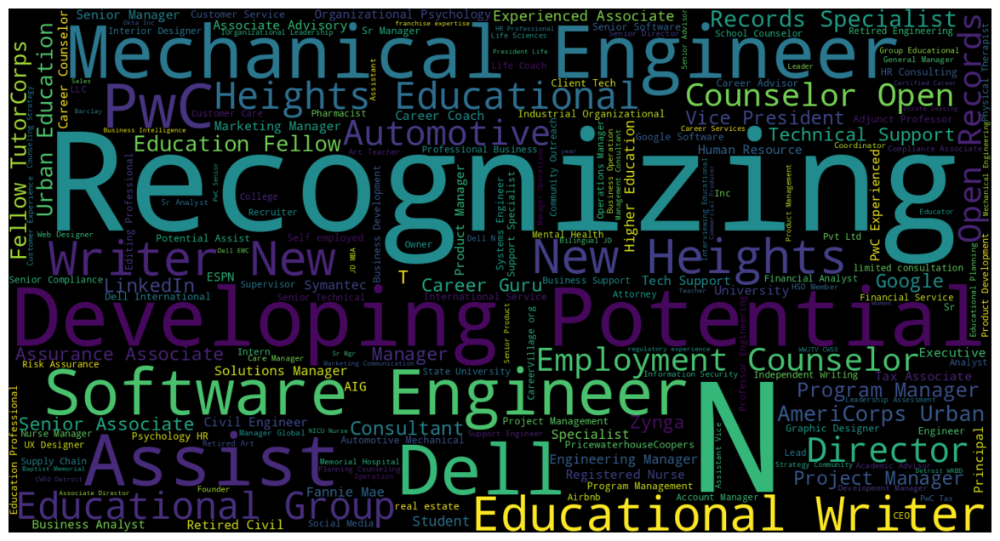

In [ ]:
wordcloud = WordCloud(width=1500, height=800).generate(professional_fields)

plt.figure(figsize=(20,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()
#machine learning, software engineer, educationla writer, counselor

## LightFM Hybrid Recommendation

Kernel Overview
1. solutions overview
2. model building
(gather data->pre-process data->prepare data for LigthFM model->Build and train
fightFM model -> Evaluate model Performace->sample prediction)
3. model in production

Gathering Data

In [ ]:
import pandas as pd
df_answer_scores = pd.read_csv('answer_scores.csv')
df_answers = pd.read_csv('answers.csv', parse_dates=['answers_date_added'])
df_answers.T

,0,1,2,3,4,5,6,7,8,9,...,51113,51114,51115,51116,51117,51118,51119,51120,51121,51122
answers_id,4e5f01128cae4f6d8fd697cec5dca60c,ada720538c014e9b8a6dceed09385ee3,eaa66ef919bc408ab5296237440e323f,1a6b3749d391486c9e371fbd1e605014,5229c514000446d582050f89ebd4e184,5f62fadae80748c7907e3b0551bf4203,1d804b3b9e764cdd90195fb138d1a5aa,08d3cf6fa20543ddbdc42f70a7bcae9e,9d33d099a03c44328fbf166aad585f63,228e5feefb4e42188b7c48a5c7eb3aa8,...,bab4cc0c6d84429a902077aad0146adb,c74b4d19700f4361a8d0ee78582d3e51,72eaf4216d9c495891c0fd1246ab1138,83458bf556a440868a515b2cdf689aec,09c4e72858a94446ba55eca5feaea100,74d708859d7e4d8c9d330506733e1fc3,2070acba9f89433fa7dd9bcdc5f12351,322bc9269c47467cbbee4f2b6b685ae2,e554bc001ece4cda9ef9524a83239fbc,563bc22e715e42bfb4b6ef9c3a95fb23
answers_author_id,36ff3b3666df400f956f8335cf53e09e,2aa47af241bf42a4b874c453f0381bd4,cbd8f30613a849bf918aed5c010340be,7e72a630c303442ba92ff00e8ea451df,17802d94699140b0a0d2995f30c034c6,b03c3872daeb4a5cb1d8cd510942f0c4,f6c89fde797d45938bce3531f55c9b6b,5bc2db4d58584f95bdba30ed2c21d573,8136c8653d3a4895b49cac90b88120d2,35c8d979b56647839c8df0f0383648cd,...,84aad4b8fcd545a6b512935460ad9ed0,177f482adc1a449284471f7c556ee8f0,588f357fb2f74666b4fefbc9c6564b24,3e97f9692b1f495cb09f937d59fe865f,10cca13647914a59b291fbb9cd91152a,b08b41c9e3724b609930779875b6b284,f1ca9370286248aba5aae737f92a07dd,9798c8df06244283ba14d30978ec318a,597cd583fb1049deb9b68ce308a992a8,5750e3d592cd4b0486ec4e7eb01c29ad
answers_question_id,332a511f1569444485cf7a7a556a5e54,eb80205482e4424cad8f16bc25aa2d9c,eb80205482e4424cad8f16bc25aa2d9c,4ec31632938a40b98909416bdd0decff,2f6a9a99d9b24e5baa50d40d0ba50a75,2f6a9a99d9b24e5baa50d40d0ba50a75,5af8880460c141dbb02971a1a8369529,5af8880460c141dbb02971a1a8369529,7c336403258f4da3a2e0955742c76462,be3c5edfdb07423e955e9b2d7f186bce,...,63c89317413046f483020585f0cc8dc4,63c89317413046f483020585f0cc8dc4,b64ef9cf0d33475ca9c22bdb8749f5a8,b64ef9cf0d33475ca9c22bdb8749f5a8,b64ef9cf0d33475ca9c22bdb8749f5a8,b64ef9cf0d33475ca9c22bdb8749f5a8,1b1ebe9afc5046ccbb328704e88e5cc0,1b1ebe9afc5046ccbb328704e88e5cc0,1b1ebe9afc5046ccbb328704e88e5cc0,1b1ebe9afc5046ccbb328704e88e5cc0
answers_date_added,2016-04-29 19:40:14+00:00,2018-05-01 14:19:08+00:00,2018-05-02 02:41:02+00:00,2017-05-10 19:00:47+00:00,2017-10-13 22:07:33+00:00,2017-10-12 16:01:44+00:00,2017-09-29 18:50:11+00:00,2018-06-08 02:39:02+00:00,2017-03-01 16:52:43+00:00,2017-10-13 18:08:20+00:00,...,2017-05-10 19:12:59+00:00,2012-01-20 19:22:03+00:00,2016-05-30 18:42:19+00:00,2016-10-01 00:17:24+00:00,2016-09-30 16:30:13+00:00,2016-10-01 08:42:28+00:00,2015-10-22 00:06:49+00:00,2015-10-21 21:52:17+00:00,2015-10-21 20:22:39+00:00,2016-03-07 01:19:40+00:00
answers_body,<p>Hi!</p>\n<p>You are asking a very interesti...,<p>Hi. I joined the Army after I attended coll...,"<p>Dear Priyanka,</p><p>Greetings! I have answ...",<p>I work for a global company who values high...,I agree with Denise. Every single job I've had...,Networking is a key component to progressing y...,https://www.unigo.com/\n\nCheck out this websi...,"<p>Hi Jocelyn ,</p><p><br></p><p>May I recomme...",<p>For the typical schedule it takes four year...,Of course! I know someone who doubled in class...,...,<p>You can also look into the toy industry whe...,<p>A Daycare Or DSS</p>,<p>Some of the things you might consider when ...,<p>In today's world education in law enforceme...,"<p>Jacky,</p>\n<p>I would strongly echo the po...",<p>Careers in law enforcement have different r...,<p>Well straight up I'm going to tell you it's...,"<p>When I was in my late thirties, with a bach...",<p>I dont think age is a criteria at all. Expe...,<p>This is a great question.</p>\n<p>For many ...


In [ ]:
df_comments = pd.read_csv('comments.csv')
df_emails = pd.read_csv('emails.csv')
df_group_memberships = pd.read_csv('group_memberships.csv')
df_groups = pd.read_csv('groups.csv')
df_matchs = pd.read_csv('matches.csv')
df_professionals = pd.read_csv('professionals.csv', parse_dates=['professionals_date_joined'])
df_question_scores = pd.read_csv('question_scores.csv')
df_questions = pd.read_csv('questions.csv', parse_dates=['questions_date_added'])
df_school_membership = pd.read_csv('school_memberships.csv')
df_students = pd.read_csv('students.csv', parse_dates=['students_date_joined'])
df_tag_questions = pd.read_csv('tag_questions.csv')
df_tag_users = pd.read_csv('tag_users.csv')
df_tags = pd.read_csv('tags.csv')

Defining our necessary functions
쉽고 빠른 생산때문에 데이터 전처리와 모델 의 모든 큰 부분의 기능을 만들었다.

In [ ]:
import numpy as np

In [ ]:
def generate_int_id(dataframe, id_col_name):
    """
    generate unique integer id for users, questions and answers

    parameters
    ----------
    dataframe:Dataframe
        pandas Dataframe for users or Q&A
    id_col_name: String
        new integer id's column name

    Returns
    ----------
    Dataframe
        updated dataframe containing new id column
    """
    new_dataframe = dataframe.assign(int_id_col_name=np.arange(len(dataframe))).reset_index(drop=True)
    return new_dataframe.rename(columns={"int_id_col_name":id_col_name})

def create_feature(dataframe, features_name, id_col_name):
    """
    Generate features that will be ready for feeding into lighfm
    parameters
    ----------
    dataframe: Dataframe
        pandas Dataframe which contains features
    features_name: List
        List of feature columns name avaible in dataframe

    """
    features = dataframe[features_name].apply(lambda x: ','.join(x.map(str)), axis=1)
    features = features.str.split(',')
    features = list(zip(dataframe[id_col_name], features))
    return features

def generate_feature_list(dataframe, features_name):
    features = dataframe[features_name].apply(lambda x:','.join(x.map(str)), axis=1)
    features = features.str.split(',')
    features = features.apply(pd.Series).stack().reset_index(drop=True)
    return features

def calculate_auc_score(lightfm_model, interactions_matrix, question_features, professional_features):
    score = auc_score(
        lightfm_model, interactions_matrix,
        item_features = question_features,
        user_features = professional_features,
        num_threads=4).mean()
    return score





In [ ]:
df_professionals = generate_int_id(df_professionals, 'professinals_id_num')
df_professionals.T

,0,1,2,3,4,5,6,7,8,9,...,28142,28143,28144,28145,28146,28147,28148,28149,28150,28151
professionals_id,9ced4ce7519049c0944147afb75a8ce3,f718dcf6d2ec4cb0a52a9db59d7f9e67,0c673e046d824ec0ad0ebe012a0673e4,977428d851b24183b223be0eb8619a8c,e2d57e5041a44f489288397c9904c2b2,c9bfa93898594cbbace436deca644c64,ed85488fb5e941eaa97014137fcbf317,102fb92c28034ad988b593d0111cb4bb,5a4a16842ec64430ac3f916aacf35fe1,81999d5ad93549dab55636a545e84f2a,...,47d169f6ab93480f9ef500f4ef0c127f,57a497a3dd214fe6880816c376211ddb,fcf9ae3fef164c9d8b3387dfaafd56dc,de0f1f642fd14a5bbea3b8d96da9638b,fda6f3b0021e48dfb14773e9e7291c2f,9f267950ab8e43e2afcf564327049297,4a7e1e5dd884488da283e1cab6ad11e0,ea75c5fce38348e0a151c3c346929e6a,34f6222c3c02480ca2df8a3e4ba878d0,ebc523719253485bb35e94ca561eb051
professionals_location,NaN,NaN,"New York, New York","Boston, Massachusetts",NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"Irving, Texas","Woodland, California","Richardson, Texas","San Diego, California","El Segundo, California","Alexandria, Virginia","Berkeley, California","Houston, Texas Area","Dallas, Texas"
professionals_industry,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Telecommunications,Information Technology and Services,Telecom,Telecommunications,Telecom,Broadcast Media,Telecommunications,Electrical engineering Computer Software,Telecommunications,Mobility and Entertainment
professionals_headline,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,MGR OSP PLNG & ENGRG DESIGN,U-Verse Manager Technical Support at AT&T,Systems Engineer,Telecommunication,Be Your Best!,"AVP, Technology at AT&T","Operations Manager, FirstNet Public Sector Sol...",GMA3 at Tesla,Customer Service Representative at AT&T,Director - Program and Project Management
professionals_date_joined,2011-10-05 20:35:19+00:00,2011-10-05 20:49:21+00:00,2011-10-18 17:31:26+00:00,2011-11-09 20:39:29+00:00,2011-12-10 22:14:44+00:00,2011-12-12 14:25:46+00:00,2011-12-28 03:02:04+00:00,2011-12-26 05:00:00+00:00,2011-12-26 05:00:00+00:00,2011-12-26 05:00:00+00:00,...,2019-01-31 23:29:17+00:00,2019-01-31 23:30:10+00:00,2019-01-31 23:34:25+00:00,2019-01-31 23:34:52+00:00,2019-01-31 23:44:35+00:00,2019-01-31 23:48:32+00:00,2019-01-31 23:53:53+00:00,2019-01-31 23:56:16+00:00,2019-01-31 23:58:31+00:00,2019-01-31 23:59:09+00:00
professinals_id_num,0,1,2,3,4,5,6,7,8,9,...,28142,28143,28144,28145,28146,28147,28148,28149,28150,28151


In [ ]:
df_students

,students_id,students_location,students_date_joined
0,12a89e96755a4dba83ff03e03043d9c0,NaN,2011-12-16 14:19:24+00:00
1,e37a5990fe354c60be5e87376b08d5e3,NaN,2011-12-27 03:02:44+00:00
2,12b402cceeda43dcb6e12ef9f2d221ea,NaN,2012-01-01 05:00:00+00:00
3,a0f431fc79794edcb104f68ce55ab897,NaN,2012-01-01 05:00:00+00:00
4,23aea4702d804bd88d1e9fb28074a1b4,NaN,2012-01-01 05:00:00+00:00
...,...,...,...
30966,1154f74f4ac14aaf8ef1b15cdda2b84f,"Ottumwa, Iowa",2019-01-31 19:13:15+00:00
30967,008c7ebabbdf4e7382870d172e6e6691,"Ottumwa, Iowa",2019-01-31 19:14:18+00:00
30968,c445148b5fc8472da00f50b86dfd8faa,"Heckmondwike, England, United Kingdom",2019-01-31 21:04:31+00:00
30969,44b3515e25454cfb80ed1df3a2a23f61,"Clermont, Florida",2019-01-31 22:29:57+00:00


In [ ]:
df_students = generate_int_id(df_students, 'students_id_num')
df_students

,students_id,students_location,students_date_joined,students_id_num
0,12a89e96755a4dba83ff03e03043d9c0,NaN,2011-12-16 14:19:24+00:00,0
1,e37a5990fe354c60be5e87376b08d5e3,NaN,2011-12-27 03:02:44+00:00,1
2,12b402cceeda43dcb6e12ef9f2d221ea,NaN,2012-01-01 05:00:00+00:00,2
3,a0f431fc79794edcb104f68ce55ab897,NaN,2012-01-01 05:00:00+00:00,3
4,23aea4702d804bd88d1e9fb28074a1b4,NaN,2012-01-01 05:00:00+00:00,4
...,...,...,...,...
30966,1154f74f4ac14aaf8ef1b15cdda2b84f,"Ottumwa, Iowa",2019-01-31 19:13:15+00:00,30966
30967,008c7ebabbdf4e7382870d172e6e6691,"Ottumwa, Iowa",2019-01-31 19:14:18+00:00,30967
30968,c445148b5fc8472da00f50b86dfd8faa,"Heckmondwike, England, United Kingdom",2019-01-31 21:04:31+00:00,30968
30969,44b3515e25454cfb80ed1df3a2a23f61,"Clermont, Florida",2019-01-31 22:29:57+00:00,30969


In [ ]:
df_questions = generate_int_id(df_questions, 'questions_id_num')
df_answers = generate_int_id(df_answers, 'answers_id_num')

merging datasets : this is one of the most important steps for our soultion. 데이터를 병합하는것은 문제를 풀기위한 가장 중요한 단계중 하나이다
Our professionals, students, q&a and tags are stored in seperate datasets.professionals, students, q&a and tags는 데이터셋이 따로 저장되어있다.  For purpose of model, we have to merge our datasets in very carefull way so that they are useful for our model. 모델의 목적에 *따라 모델의 유용한 우리의 데이터셋을  매우 조심스런 방법으로 병합해야 한다*.
데이터셋이 모델에 유용하게 활용될 수 있도록 매우 조심스런 방법으로 병합해야한다.






In [ ]:
# merging dataset
df_tags = df_tags.dropna()  #Pandas DataFrame 또는 Series에서 결측값(NaN, None) 제거하는 함수 16269- -> 16268

In [ ]:
 df_tags['tags_tag_name'] = df_tags['tags_tag_name'].str.replace("#", '')

In [ ]:
# merge tag_questions with tags name
#then group all tags for each question into single rows
df_tags_question = df_tag_questions.merge(df_tags, how='inner', left_on='tag_questions_tag_id', right_on='tags_tag_id')
df_tags_question

,tag_questions_tag_id,tag_questions_question_id,tags_tag_id,tags_tag_name
0,28930,cb43ebee01364c68ac61d347a393ae39,28930,minor
1,28930,47f55e85ce944242a5a347ab85a8ffb4,28930,minor
2,28930,ccc30a033a0f4dfdb2eb987012f25792,28930,minor
3,28930,e30b274e48d741f7bf50eb5e7171a3c0,28930,minor
4,28930,3d22742052df4989b311b4195cbb0f1a,28930,minor
...,...,...,...,...
76548,39183,72affe86909d49c09761a1d376476c92,39183,austria
76549,39248,5b86153f2b6c46a4801bb39e10e01281,39248,weldernation
76550,39249,0946a81d511b48c58376fd59058d3b12,39249,welder
76551,39249,b4de8ccfcd874481bfc80ceacb0caac8,39249,welder


In [ ]:
print(df_tags_question.columns)


Index(['tag_questions_tag_id', 'tag_questions_question_id', 'tags_tag_id',
       'tags_tag_name'],
      dtype='object')


In [ ]:
df_tags_question =df_tags_question.groupby(['tag_questions_question_id'])['tags_tag_name'].apply(','.join).reset_index()
# 하나의 질문에 여러개의 태그가 있을 때

In [ ]:
df_tags_question = df_tags_question.rename(columns={'tags_tag_name':'questions_tag_name'})
df_tags_question

,tag_questions_question_id,questions_tag_name
0,0003e7bf48f24b5c985f8fce96e611f3,"internship,technology,high-school,information-..."
1,0006609dd4da40dcaa5a83e0499aba14,"psychology,law"
2,000af224bc2f4e94a19f8b62ba279cc4,"biology,marine"
3,000b30fb534b41f7b716fa9ebf9c3f35,"teaching,exercise-science,school,exercise"
4,0018752e44b44e26bb74a0a43232b4d6,"math,puremathematics"
...,...,...
23283,ffec9bebe1b84a02a1614c7dee44760f,"healthcare,management,50yearold"
23284,fff69ee35d574057aa9911e844e101b5,"veterinary,vet"
23285,fff942d6b0b34a638ecf02428304cdb0,jobs
23286,fffc471e892a4b4e826858426da79b7e,computer


In [ ]:
df_tag_questions['tags_tag_name'].apply(','.join)

,tags_tag_name
0,"m,i,n,o,r"
1,"m,i,n,o,r"
2,"m,i,n,o,r"
3,"m,i,n,o,r"
4,"m,i,n,o,r"
...,...
76548,"a,u,s,t,r,i,a"
76549,"w,e,l,d,e,r,n,a,t,i,o,n"
76550,"w,e,l,d,e,r"
76551,"w,e,l,d,e,r"


In [ ]:
df_tags_pro = df_tag_users.merge(df_tags, how='inner', left_on='tag_users_tag_id', right_on='tags_tag_id')
df_tags_pro

,tag_users_tag_id,tag_users_user_id,tags_tag_id,tags_tag_name
0,593,c72ab38e073246e88da7e9a4ec7a4472,593,computer-software
1,1642,8db519781ec24f2e8bdc67c2ac53f614,1642,programming
2,638,042d2184ee3e4e548fc3589baaa69caf,638,running
3,11093,c660bd0dc1b34224be78a58aa5a84a63,11093,life-coach
4,21539,8ce1dca4e94240239e4385ed22ef43ce,21539,art
...,...,...,...,...
136658,18609,1d9ba1fe480f491a918a89688c4aa053,18609,project-management
136659,18145,1d9ba1fe480f491a918a89688c4aa053,18145,management
136660,15360,1d9ba1fe480f491a918a89688c4aa053,15360,military-officer
136661,31705,d7c0825fc2c64269ac3c55c31a043b1d,31705,business


In [ ]:
df_tags_pro = df_tags_pro.groupby(['tag_users_user_id'])['tags_tag_name'].apply(','.join).reset_index()
df_tags_pro

,tag_users_user_id,tags_tag_name
0,00009a0f9bda43eba47104e9ac62aff5,"digital-media,script-writing,content-creation"
1,000196ef8db54b9a86ae70ad31745d04,accounting
2,0008138be908438e8944b21f7f57f2c1,real-estate
3,000d4635e5da41e3bfd83677ee11dda4,"university,information-technology,college"
4,000e2b5714444d79a672bf927905135c,financial-services
...,...,...
30197,fff8a862a80b4181a1d2584f5bc3fdc3,marketing-and-advertising
30198,fffa0ff907ff4a9a84cb1b142911eee1,"volunteer-management,volunteer-leadership"
30199,fffb74900f994cb580448a28ff57a456,"hospitality,hotel-management,international-rel..."
30200,ffffbe8d854a4a5a8ab1a381224f5b80,"internship,accounting,audit,cpa,business,colle..."


In [ ]:
df_tags_pro = df_tags_pro.rename(columns={'tags_tag_name':'professinals_tag_name'})
df_tags_pro

,tag_users_user_id,professinals_tag_name
0,00009a0f9bda43eba47104e9ac62aff5,"digital-media,script-writing,content-creation"
1,000196ef8db54b9a86ae70ad31745d04,accounting
2,0008138be908438e8944b21f7f57f2c1,real-estate
3,000d4635e5da41e3bfd83677ee11dda4,"university,information-technology,college"
4,000e2b5714444d79a672bf927905135c,financial-services
...,...,...
30197,fff8a862a80b4181a1d2584f5bc3fdc3,marketing-and-advertising
30198,fffa0ff907ff4a9a84cb1b142911eee1,"volunteer-management,volunteer-leadership"
30199,fffb74900f994cb580448a28ff57a456,"hospitality,hotel-management,international-rel..."
30200,ffffbe8d854a4a5a8ab1a381224f5b80,"internship,accounting,audit,cpa,business,colle..."


In [ ]:
df_questions=df_questions.merge(df_tags_question, how='left', left_on='questions_id', right_on='tag_questions_question_id')
df_questions

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,questions_id_num,tag_questions_question_id,questions_tag_name
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26+00:00,Teacher career question,What is a maths teacher? what is a ma...,0,332a511f1569444485cf7a7a556a5e54,"lecture,college,professor"
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25+00:00,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,1,eb80205482e4424cad8f16bc25aa2d9c,"military,army"
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38+00:00,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,2,4ec31632938a40b98909416bdd0decff,"overseas,working-abroad"
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32+00:00,To become a specialist in business management...,i hear business management is a hard way to ge...,3,2f6a9a99d9b24e5baa50d40d0ba50a75,"networking,business"
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54+00:00,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...,4,5af8880460c141dbb02971a1a8369529,"scholarships,highschoolsenior,college,firstgen..."
...,...,...,...,...,...,...,...,...
23926,ce1ff7a035d74721a5b7d21105f9ddb6,c1c6e6a8c9df4c02af52eda6fa0c552f,2016-04-07 01:08:59+00:00,What is a computer engineer & a computer progr...,<p>I want to know which one is better to do an...,23926,NaN,NaN
23927,7df38c9ded4a4474bb4f9c1f659e1ad1,6ab792d625e14eb2abc14f9a57a450aa,2015-01-26 17:44:44+00:00,What major do I need to study to be a writer,I am a high school junior and for awhile now I...,23927,7df38c9ded4a4474bb4f9c1f659e1ad1,"famous,journalism,writer,educator,novel-writer"
23928,63c89317413046f483020585f0cc8dc4,977428d851b24183b223be0eb8619a8c,2011-11-09 20:42:47+00:00,Which careers are good if I enjoy working with...,"I have been volunteering, and I have found tha...",23928,63c89317413046f483020585f0cc8dc4,"children,education"
23929,b64ef9cf0d33475ca9c22bdb8749f5a8,82cc74c0e18347e4b68b219e250eb10f,2016-05-28 03:08:07+00:00,How can going to college help me advance my ca...,I am thinking about a career in law enforcemen...,23929,b64ef9cf0d33475ca9c22bdb8749f5a8,"police,law-enforcement"


In [ ]:
df_professionals = df_professionals.merge(df_tags_pro, how='left', left_on='professionals_id', right_on='tag_users_user_id')
df_professionals

,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined,professinals_id_num,tag_users_user_id,professinals_tag_name
0,9ced4ce7519049c0944147afb75a8ce3,NaN,NaN,NaN,2011-10-05 20:35:19+00:00,0,NaN,NaN
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,NaN,NaN,NaN,2011-10-05 20:49:21+00:00,1,NaN,NaN
2,0c673e046d824ec0ad0ebe012a0673e4,"New York, New York",NaN,NaN,2011-10-18 17:31:26+00:00,2,0c673e046d824ec0ad0ebe012a0673e4,"consulting,education,consulting,education,cons..."
3,977428d851b24183b223be0eb8619a8c,"Boston, Massachusetts",NaN,NaN,2011-11-09 20:39:29+00:00,3,NaN,NaN
4,e2d57e5041a44f489288397c9904c2b2,NaN,NaN,NaN,2011-12-10 22:14:44+00:00,4,NaN,NaN
...,...,...,...,...,...,...,...,...
28147,9f267950ab8e43e2afcf564327049297,"El Segundo, California",Broadcast Media,"AVP, Technology at AT&T",2019-01-31 23:48:32+00:00,28147,9f267950ab8e43e2afcf564327049297,broadcast-media
28148,4a7e1e5dd884488da283e1cab6ad11e0,"Alexandria, Virginia",Telecommunications,"Operations Manager, FirstNet Public Sector Sol...",2019-01-31 23:53:53+00:00,28148,4a7e1e5dd884488da283e1cab6ad11e0,"telecommunications,firstnet,inbuildingsolutions"
28149,ea75c5fce38348e0a151c3c346929e6a,"Berkeley, California",Electrical engineering Computer Software,GMA3 at Tesla,2019-01-31 23:56:16+00:00,28149,ea75c5fce38348e0a151c3c346929e6a,"computer-software,electrical-engineering,hardw..."
28150,34f6222c3c02480ca2df8a3e4ba878d0,"Houston, Texas Area",Telecommunications,Customer Service Representative at AT&T,2019-01-31 23:58:31+00:00,28150,34f6222c3c02480ca2df8a3e4ba878d0,telecommunications


In [ ]:
df_questions = df_questions.merge(df_question_scores, how='left', left_on='questions_id', right_on='id')

In [ ]:
df_questions.head()

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,questions_id_num,tag_questions_question_id,questions_tag_name,id,score
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26+00:00,Teacher career question,What is a maths teacher? what is a ma...,0,332a511f1569444485cf7a7a556a5e54,"lecture,college,professor",332a511f1569444485cf7a7a556a5e54,1.0
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25+00:00,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,1,eb80205482e4424cad8f16bc25aa2d9c,"military,army",eb80205482e4424cad8f16bc25aa2d9c,5.0
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38+00:00,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,2,4ec31632938a40b98909416bdd0decff,"overseas,working-abroad",4ec31632938a40b98909416bdd0decff,2.0
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32+00:00,To become a specialist in business management...,i hear business management is a hard way to ge...,3,2f6a9a99d9b24e5baa50d40d0ba50a75,"networking,business",2f6a9a99d9b24e5baa50d40d0ba50a75,2.0
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54+00:00,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...,4,5af8880460c141dbb02971a1a8369529,"scholarships,highschoolsenior,college,firstgen...",5af8880460c141dbb02971a1a8369529,2.0


In [ ]:
df_questions = df_questions.merge(
    df_students, how='left',
    left_on='questions_author_id', right_on='students_id')

df_questions

,questions_id,questions_author_id,questions_date_added,questions_title,questions_body,questions_id_num,tag_questions_question_id,questions_tag_name,id,score,students_id,students_location,students_date_joined,students_id_num
0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26+00:00,Teacher career question,What is a maths teacher? what is a ma...,0,332a511f1569444485cf7a7a556a5e54,"lecture,college,professor",332a511f1569444485cf7a7a556a5e54,1.0,8f6f374ffd834d258ab69d376dd998f5,"Coimbatore, Tamil Nadu, India",2016-04-22 10:07:32+00:00,6890.0
1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25+00:00,I want to become an army officer. What can I d...,I am Priyanka from Bangalore . Now am in 10th ...,1,eb80205482e4424cad8f16bc25aa2d9c,"military,army",eb80205482e4424cad8f16bc25aa2d9c,5.0,acccbda28edd4362ab03fb8b6fd2d67b,"Providence, Rhode Island",2016-05-20 16:29:08+00:00,10189.0
2,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38+00:00,Will going abroad for your first job increase ...,I'm planning on going abroad for my first job....,2,4ec31632938a40b98909416bdd0decff,"overseas,working-abroad",4ec31632938a40b98909416bdd0decff,2.0,f2c179a563024ccc927399ce529094b5,NaN,2017-02-07 15:51:57+00:00,18023.0
3,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32+00:00,To become a specialist in business management...,i hear business management is a hard way to ge...,3,2f6a9a99d9b24e5baa50d40d0ba50a75,"networking,business",2f6a9a99d9b24e5baa50d40d0ba50a75,2.0,2c30ffba444e40eabb4583b55233a5a4,"North Lauderdale, Florida",2017-09-01 14:02:02+00:00,20803.0
4,5af8880460c141dbb02971a1a8369529,aa9eb1a2ab184ebbb00dc01ab663428a,2017-09-01 02:36:54+00:00,Are there any scholarships out there for stude...,I'm trying to find scholarships for first year...,4,5af8880460c141dbb02971a1a8369529,"scholarships,highschoolsenior,college,firstgen...",5af8880460c141dbb02971a1a8369529,2.0,aa9eb1a2ab184ebbb00dc01ab663428a,"Tunnel Hill, Georgia",2017-09-01 02:29:06+00:00,20505.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23926,ce1ff7a035d74721a5b7d21105f9ddb6,c1c6e6a8c9df4c02af52eda6fa0c552f,2016-04-07 01:08:59+00:00,What is a computer engineer & a computer progr...,<p>I want to know which one is better to do an...,23926,NaN,NaN,ce1ff7a035d74721a5b7d21105f9ddb6,9.0,c1c6e6a8c9df4c02af52eda6fa0c552f,"Manassas, Virginia",2016-03-25 20:28:51+00:00,6439.0
23927,7df38c9ded4a4474bb4f9c1f659e1ad1,6ab792d625e14eb2abc14f9a57a450aa,2015-01-26 17:44:44+00:00,What major do I need to study to be a writer,I am a high school junior and for awhile now I...,23927,7df38c9ded4a4474bb4f9c1f659e1ad1,"famous,journalism,writer,educator,novel-writer",7df38c9ded4a4474bb4f9c1f659e1ad1,5.0,6ab792d625e14eb2abc14f9a57a450aa,"La Mirada, California",2015-01-26 17:37:23+00:00,2822.0
23928,63c89317413046f483020585f0cc8dc4,977428d851b24183b223be0eb8619a8c,2011-11-09 20:42:47+00:00,Which careers are good if I enjoy working with...,"I have been volunteering, and I have found tha...",23928,63c89317413046f483020585f0cc8dc4,"children,education",63c89317413046f483020585f0cc8dc4,5.0,NaN,NaN,NaT,NaN
23929,b64ef9cf0d33475ca9c22bdb8749f5a8,82cc74c0e18347e4b68b219e250eb10f,2016-05-28 03:08:07+00:00,How can going to college help me advance my ca...,I am thinking about a career in law enforcemen...,23929,b64ef9cf0d33475ca9c22bdb8749f5a8,"police,law-enforcement",b64ef9cf0d33475ca9c22bdb8749f5a8,4.0,82cc74c0e18347e4b68b219e250eb10f,"Hemet, California",2016-05-28 03:00:23+00:00,11728.0


In [ ]:
df_merge = df_answers.merge(df_questions, how='inner', left_on='answers_question_id', right_on='questions_id')
df_merge = df_merge.merge(df_professionals, how='inner', left_on='answers_author_id', right_on='professionals_id')
df_merge = df_merge.merge(df_question_scores, how='inner', left_on='questions_id', right_on='id')

# generate some features

In [ ]:
df_merge.columns

Index(['answers_id', 'answers_author_id', 'answers_question_id',
       'answers_date_added', 'answers_body', 'answers_id_num', 'questions_id',
       'questions_author_id', 'questions_date_added', 'questions_title',
       'questions_body', 'questions_id_num', 'tag_questions_question_id',
       'questions_tag_name', 'id_x', 'score_x', 'students_id',
       'students_location', 'students_date_joined', 'students_id_num',
       'professionals_id', 'professionals_location', 'professionals_industry',
       'professionals_headline', 'professionals_date_joined',
       'professinals_id_num', 'tag_users_user_id', 'professinals_tag_name',
       'id_y', 'score_y'],
      dtype='object')

In [ ]:
# generate some  features for calculates weights
# that will use with interaction matrix

df_merge['num_of_ans_by_professional'] = df_merge.groupby(['answers_author_id'])['questions_id'].transform('count')
df_merge['num_ans_per_ques'] = df_merge.groupby(['questions_id'])['answers_id'].transform('count')
df_merge['num_tags_professinal'] = df_merge['professinals_tag_name'].str.split(",").str.len()
df_merge['num_tags_question'] = df_merge['questions_tag_name'].str.split(",").str.len()

In [ ]:
print("Maximum number of answer per question:" + str(df_merge['num_ans_per_ques'].max()))
print("Maximum number of tags per professinal:" + str(df_merge['num_tags_professinal'].max()))
print("Maximum number of tags per question:" + str(df_merge['num_tags_question'].max()))

Maximum number of answer per question:58
Maximum number of tags per professinal:82.0
Maximum number of tags per question:54.0


In [ ]:
#Merge professionals previous answered
#questions tag into professinals tag

#select professinals answered questions tags
# and stored as a dataframe

professionals_prev_ans_tags = df_merge[['professionals_id', 'questions_tag_name']]

#drop null values form that
professionals_prev_ans_tags = professionals_prev_ans_tags.dropna()
#because professionals answers multiple questions
# we group all of tags of each user into single row
professionals_prev_ans_tags = professionals_prev_ans_tags.groupby(['professionals_id'])['questions_tag_name'].apply(','.join).reset_index()

#drop dulicates trags form each professionals rows
professionals_prev_ans_tags['questions_tag_name'] = (professionals_prev_ans_tags['questions_tag_name'].str.split(',').apply(set).str.join(','))



In [ ]:
df_professionals = df_professionals.merge(professionals_prev_ans_tags, how='left', on='professionals_id')
df_professionals

,professionals_id,professionals_location,professionals_industry,professionals_headline,professionals_date_joined,professinals_id_num,tag_users_user_id,professinals_tag_name,questions_tag_name
0,9ced4ce7519049c0944147afb75a8ce3,NaN,NaN,NaN,2011-10-05 20:35:19+00:00,0,NaN,NaN,"resume,consulting"
1,f718dcf6d2ec4cb0a52a9db59d7f9e67,NaN,NaN,NaN,2011-10-05 20:49:21+00:00,1,NaN,NaN,NaN
2,0c673e046d824ec0ad0ebe012a0673e4,"New York, New York",NaN,NaN,2011-10-18 17:31:26+00:00,2,0c673e046d824ec0ad0ebe012a0673e4,"consulting,education,consulting,education,cons...","forensic,career-paths,interviews,bain,coaching..."
3,977428d851b24183b223be0eb8619a8c,"Boston, Massachusetts",NaN,NaN,2011-11-09 20:39:29+00:00,3,NaN,NaN,"motivation,forensic,law-enforcement,criminal-j..."
4,e2d57e5041a44f489288397c9904c2b2,NaN,NaN,NaN,2011-12-10 22:14:44+00:00,4,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
28147,9f267950ab8e43e2afcf564327049297,"El Segundo, California",Broadcast Media,"AVP, Technology at AT&T",2019-01-31 23:48:32+00:00,28147,9f267950ab8e43e2afcf564327049297,broadcast-media,NaN
28148,4a7e1e5dd884488da283e1cab6ad11e0,"Alexandria, Virginia",Telecommunications,"Operations Manager, FirstNet Public Sector Sol...",2019-01-31 23:53:53+00:00,28148,4a7e1e5dd884488da283e1cab6ad11e0,"telecommunications,firstnet,inbuildingsolutions",NaN
28149,ea75c5fce38348e0a151c3c346929e6a,"Berkeley, California",Electrical engineering Computer Software,GMA3 at Tesla,2019-01-31 23:56:16+00:00,28149,ea75c5fce38348e0a151c3c346929e6a,"computer-software,electrical-engineering,hardw...",NaN
28150,34f6222c3c02480ca2df8a3e4ba878d0,"Houston, Texas Area",Telecommunications,Customer Service Representative at AT&T,2019-01-31 23:58:31+00:00,28150,34f6222c3c02480ca2df8a3e4ba878d0,telecommunications,NaN


In [ ]:
#join professinals tags and their answered tags
# we replace nan value with
df_professionals['professinal_all_tags'] = (df_professionals[['professinals_tag_name', 'questions_tag_name']].apply(lambda x: ','.join(x.dropna()), axis=1))

In [ ]:
#handling null values
df_questions['score'] = df_questions['score'].fillna(0)
df_questions['score'] = df_questions['score'].astype(int)

In [ ]:
df_professionals.columns

Index(['professionals_id', 'professionals_location', 'professionals_industry',
       'professionals_headline', 'professionals_date_joined',
       'professinals_id_num', 'tag_users_user_id', 'professinals_tag_name',
       'questions_tag_name', 'professinal_all_tags'],
      dtype='object')

In [ ]:
df_questions['questions_tag_name'] = df_questions['questions_tag_name'].fillna('No Tag')
#remove duplcatie tags form each questions
df_questions['questions_tag_name'] = df_questions['questions_tag_name'].str.split(',').apply(set).str.join(',')

#fill nan with 'No Tag' if any
df_professionals['professinal_all_tags'] = df_professionals['professinal_all_tags'].fillna('No Tag')
#replace "" with "No Tag", because previsouly we replace nan with
df_professionals['professinal_all_tags'] = df_professionals['professinal_all_tags'].replace('', 'No Tag')

df_professionals['professionals_location'] = df_professionals['professionals_location'].fillna('No Location')
df_professionals['professionals_industry'] = df_professionals['professionals_industry'].fillna('No Industry')

In [ ]:
#remove dulicates tags from each professionals
df_professionals['professinal_all_tags'] = df_professionals['professinal_all_tags'].str.split(',').apply(set).str.join(',')

df_merge['num_ans_per_ques'] = df_merge['num_ans_per_ques'].fillna(0)
df_merge['num_tags_professinal'] = df_merge['num_tags_professinal'].fillna(0)
df_merge['num_tags_question'] = df_merge['num_tags_question'].fillna(0)

In [ ]:
df_merge

,answers_id,answers_author_id,answers_question_id,answers_date_added,answers_body,answers_id_num,questions_id,questions_author_id,questions_date_added,questions_title,...,professionals_date_joined,professinals_id_num,tag_users_user_id,professinals_tag_name,id_y,score_y,num_of_ans_by_professional,num_ans_per_ques,num_tags_professinal,num_tags_question
0,4e5f01128cae4f6d8fd697cec5dca60c,36ff3b3666df400f956f8335cf53e09e,332a511f1569444485cf7a7a556a5e54,2016-04-29 19:40:14+00:00,<p>Hi!</p>\n<p>You are asking a very interesti...,0,332a511f1569444485cf7a7a556a5e54,8f6f374ffd834d258ab69d376dd998f5,2016-04-26 11:14:26+00:00,Teacher career question,...,2015-10-19 20:56:49+00:00,2410,36ff3b3666df400f956f8335cf53e09e,"career,jobs,engineering,career-choice,college,...",332a511f1569444485cf7a7a556a5e54,1,1710,1,12.0,3.0
1,ada720538c014e9b8a6dceed09385ee3,2aa47af241bf42a4b874c453f0381bd4,eb80205482e4424cad8f16bc25aa2d9c,2018-05-01 14:19:08+00:00,<p>Hi. I joined the Army after I attended coll...,1,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25+00:00,I want to become an army officer. What can I d...,...,2018-03-23 13:43:28+00:00,17493,2aa47af241bf42a4b874c453f0381bd4,"telecommunications,internal-investigations",eb80205482e4424cad8f16bc25aa2d9c,5,1,2,2.0,2.0
2,eaa66ef919bc408ab5296237440e323f,cbd8f30613a849bf918aed5c010340be,eb80205482e4424cad8f16bc25aa2d9c,2018-05-02 02:41:02+00:00,"<p>Dear Priyanka,</p><p>Greetings! I have answ...",2,eb80205482e4424cad8f16bc25aa2d9c,acccbda28edd4362ab03fb8b6fd2d67b,2016-05-20 16:48:25+00:00,I want to become an army officer. What can I d...,...,2017-11-11 11:12:56+00:00,14283,cbd8f30613a849bf918aed5c010340be,"telecommunications,leadership-and-motivation,d...",eb80205482e4424cad8f16bc25aa2d9c,5,52,2,15.0,2.0
3,1a6b3749d391486c9e371fbd1e605014,7e72a630c303442ba92ff00e8ea451df,4ec31632938a40b98909416bdd0decff,2017-05-10 19:00:47+00:00,<p>I work for a global company who values high...,3,4ec31632938a40b98909416bdd0decff,f2c179a563024ccc927399ce529094b5,2017-02-08 19:13:38+00:00,Will going abroad for your first job increase ...,...,2017-05-09 19:21:33+00:00,11268,7e72a630c303442ba92ff00e8ea451df,"insurance,travel,business-travel,man,management",4ec31632938a40b98909416bdd0decff,2,22,1,5.0,2.0
4,5229c514000446d582050f89ebd4e184,17802d94699140b0a0d2995f30c034c6,2f6a9a99d9b24e5baa50d40d0ba50a75,2017-10-13 22:07:33+00:00,I agree with Denise. Every single job I've had...,4,2f6a9a99d9b24e5baa50d40d0ba50a75,2c30ffba444e40eabb4583b55233a5a4,2017-09-01 14:05:32+00:00,To become a specialist in business management...,...,2017-10-13 19:58:31+00:00,13660,17802d94699140b0a0d2995f30c034c6,"business,marketing,sales,sales-operations,comm...",2f6a9a99d9b24e5baa50d40d0ba50a75,2,4,2,13.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50093,74d708859d7e4d8c9d330506733e1fc3,b08b41c9e3724b609930779875b6b284,b64ef9cf0d33475ca9c22bdb8749f5a8,2016-10-01 08:42:28+00:00,<p>Careers in law enforcement have different r...,51118,b64ef9cf0d33475ca9c22bdb8749f5a8,82cc74c0e18347e4b68b219e250eb10f,2016-05-28 03:08:07+00:00,How can going to college help me advance my ca...,...,2016-01-19 06:54:26+00:00,3510,b08b41c9e3724b609930779875b6b284,"law-enforcement,public-administration",b64ef9cf0d33475ca9c22bdb8749f5a8,4,10,4,2.0,2.0
50094,2070acba9f89433fa7dd9bcdc5f12351,f1ca9370286248aba5aae737f92a07dd,1b1ebe9afc5046ccbb328704e88e5cc0,2015-10-22 00:06:49+00:00,<p>Well straight up I'm going to tell you it's...,51119,1b1ebe9afc5046ccbb328704e88e5cc0,d233c9936cd64363877ffea1feb10c35,2015-10-21 20:16:38+00:00,Is age a factor for hiring entry level compute...,...,2015-05-14 00:17:18+00:00,2078,f1ca9370286248aba5aae737f92a07dd,"computer-software,software-industry,computer-e...",1b1ebe9afc5046ccbb328704e88e5cc0,10,6,4,3.0,4.0
50095,322bc9269c47467cbbee4f2b6b685ae2,9798c8df06244283ba14d30978ec318a,1b1ebe9afc5046ccbb328704e88e5cc0,2015-10-21 21:52:17+00:00,"<p>When I was in my late th

building model in LightFM
interection matrix, weights and user/item features

In [ ]:
def generate_feature_list(dataframe, features_name):
    features = dataframe[features_name].apply(lambda x:','.join(x.map(str)), axis=1)
    features = features.str.split(',')
    features = features.apply(pd.Series).stack().reset_index(drop=True)
    return features

In [ ]:
question_features_list = generate_feature_list(df_questions, ['questions_tag_name'])
question_features_list

,0
0,lecture
1,professor
2,college
3,army
4,military
...,...
77191,police
77192,java
77193,programming
77194,computer-science


In [ ]:
professional_feature_list = generate_feature_list(df_professionals, ['professinal_all_tags'])
professional_feature_list

,0
0,resume
1,consulting
2,No Tag
3,forensic
4,career-paths
...,...
228831,organization
228832,staff-development
228833,communications
228834,mentoring


In [ ]:
df_professionals.columns

Index(['professionals_id', 'professionals_location', 'professionals_industry',
       'professionals_headline', 'professionals_date_joined',
       'professinals_id_num', 'tag_users_user_id', 'professinals_tag_name',
       'questions_tag_name', 'professinal_all_tags'],
      dtype='object')

In [ ]:
#calculate our weight value
df_merge['total_weights'] = 1 / (df_merge['num_ans_per_ques'])

#createing features for feeding into lightfm
df_questions['question_feature'] = create_feature(df_questions, ['questions_tag_name'], 'questions_id_num')

df_professionals['professional_features'] = create_feature(df_professionals, ['professinal_all_tags'], 'professinals_id_num')


In [ ]:
df_professionals['professional_features']

,professional_features
0,"(0, [resume, consulting])"
1,"(1, [No Tag])"
2,"(2, [forensic, career-paths, interviews, bain,..."
3,"(3, [motivation, forensic, law-enforcement, cr..."
4,"(4, [No Tag])"
...,...
28147,"(28147, [broadcast-media])"
28148,"(28148, [firstnet, telecommunications, inbuild..."
28149,"(28149, [hardware-engineer, electrical-enginee..."
28150,"(28150, [telecommunications])"


In [ ]:
pip install lightfm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.4/316.4 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lightfm: filename=lightfm-1.17-cp311-cp311-linux_x86_64.whl size=831159 sha256=19863cfe8a6e325b8b5b7d32268d838190442ac00c47cd84f5018769bcfcef23
  Stored in directory: /root/.cache/pip/wheels/b9/0d/8a/0729d2e6e3ca2a898ba55201f905da7db3f838a33df5b3fcdd
Successfully built lightfm


In [ ]:
df_questions.columns

Index(['questions_id', 'questions_author_id', 'questions_date_added',
       'questions_title', 'questions_body', 'questions_id_num',
       'tag_questions_question_id', 'questions_tag_name', 'id', 'score',
       'students_id', 'students_location', 'students_date_joined',
       'students_id_num', 'question_feature'],
      dtype='object')

In [ ]:
from lightfm.data import Dataset
# dataset building for lightfm

#define our dataset variable
#then we feed uniqe professionals and questions ids
#and item and professinal feature list
#this will create lightfm interne mapping

dataset = Dataset()
dataset.fit(
    set(df_professionals['professinals_id_num']),
    set(df_questions['questions_id_num']),
    item_features=question_features_list,
    user_features=professional_feature_list)


#now we are building interactions matrix btw professionals and questions
# we are passing professional and questions id as a tuple
#then we use lightfm build in method for building interactions matrix

df_merge['author_question_id_tuple'] = list(zip(
    df_merge.professinals_id_num, df_merge.questions_id_num, df_merge.total_weights
))

interaction, weights = dataset.build_interactions(
    df_merge['author_question_id_tuple']
)

#now we are building our questions and professionals features
# in a way that lightfm understand
#we are using lightfm build in method for building
#questions and professionals features
questions_features = dataset.build_item_features(
    df_questions['question_feature']
)

professional_features = dataset.build_user_features(df_professionals['professional_features'])

Model building and training

In [ ]:
#model building part
from lightfm import LightFM
#define lightfm model by specifying hyperparmeter
#then fit the model with interactions matrix, item and user features
model = LightFM(
                no_components=150,
                learning_rate=0.05,
                loss='warp', #WARP(Weighted Approximate-Rank Pairwise) 손실 함수 사용.
                random_state=2019)

model.fit(
    interaction,
    item_features=questions_features,
    user_features=professional_features, sample_weight=weights,
    epochs=5, num_threads=4, verbose=True
)

Epoch: 100%|██████████| 5/5 [01:07<00:00, 13.47s/it]


Evaluating the performace of the model

In [ ]:
def calculate_auc_score(lightfm_model, interactions_matrix,
                        question_features, professional_features):
    score = auc_score(
        lightfm_model, interactions_matrix,
        item_features=question_features,
        user_features=professional_features,
        num_threads=4).mean()
    return score

In [ ]:
from lightfm.evaluation import auc_score
calculate_auc_score(model, interaction, questions_features, professional_features)

0.91459644

make real recommendations

In [ ]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

def recommend_questions(professional_ids):

    for professional in professional_ids:
        # print their previous answered question title
        previous_q_id_num = df_merge.loc[df_merge['professinals_id_num'] == professional][:3]['questions_id_num']
        df_previous_questions = df_questions.loc[df_questions['questions_id_num'].isin(previous_q_id_num)]
        print('Professional Id (' + str(professional) + "): Previous Answered Questions")
        display_side_by_side(
            df_previous_questions[['questions_title', 'question_feature']],
            df_professionals.loc[df_professionals.professinals_id_num == professional][['professinals_id_num','professinals_tag_name']])

        # predict
        discard_qu_id = df_previous_questions['questions_id_num'].values.tolist()
        df_use_for_prediction = df_questions.loc[~df_questions['questions_id_num'].isin(discard_qu_id)]
        questions_id_for_predict = df_use_for_prediction['questions_id_num'].values.tolist()

        scores = model.predict(
            professional,
            questions_id_for_predict,
            item_features=questions_features,
            user_features=professional_features)

        df_use_for_prediction['scores'] = scores
        df_use_for_prediction = df_use_for_prediction.sort_values(by='scores', ascending=False)[:8]
        print('Professional Id (' + str(professional) + "): Recommended Questions: ")
        display(df_use_for_prediction[['questions_title', 'question_feature']])

In [ ]:
recommend_questions([1200 ,19897, 3])

Professional Id (1200): Previous Answered Questions


,questions_title,question_feature
,professinals_id_num,professinals_tag_name
1200,1200,"dj,entrepreneurship,marketing,advertising,football,analytics,data-analysis,java,python,real-estate,billiards,blackjack,break,display-advertising,hip-hop,online-advertising,strategy,management,team-leadership"


Professional Id (1200): Recommended Questions: 


,questions_title,question_feature
19011,How do you get started in starting your own bu...,"(19011, [business, management, marketing])"
9802,Is marketing a good major?,"(9802, [business, marketing])"
22676,What are some specific daily responsibilities ...,"(22676, [business, marketing-and-advertising, ..."
14451,What is the best way to find a good internship...,"(14451, [business, marketing])"
23680,what makes markerting so important in business?,"(23680, [business, marketing])"
19396,Is working in a cubicle as exhausting as peopl...,"(19396, [business, finance, marketing])"
17876,Is it worth it to pursue an advanced degree in...,"(17876, [business, marketing])"
9330,how can i get my business heard of ?,"(9330, [advertising, entrepreneurship, marketi..."


Professional Id (19897): Previous Answered Questions


,questions_title,question_feature
22784,Do companies truly focus on your college major when applying for jobs?,"(22784, [major])"
,professinals_id_num,professinals_tag_name
19897,19897,"graphic-design,illustration,adobe-creative-suite,comic-books"


Professional Id (19897): Recommended Questions: 


<ipython-input-84-c01ecaf442a7>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_use_for_prediction['scores'] = scores


,questions_title,question_feature
19407,How can you be a successful photographer? What...,"(19407, [art, photography, graphic-design])"
2310,what is one of best things about being an anim...,"(2310, [design, artist, animation, art])"
9682,How to get started in animation?,"(9682, [art, artist, animation])"
6058,How should you start in the Graphic Design ind...,"(6058, [design, graphic-design, art])"
13484,Would a Graphic Design degree be a feesible op...,"(13484, [art, graphic-design])"
11231,Do I have to live in a big city to do well in ...,"(11231, [art, artist, graphic-design, design, ..."
19471,Graphic Design - job outlook for the next 10 y...,"(19471, [art, graphic-design])"
19275,how do i get my content (animations) out in th...,"(19275, [art, animation])"


Professional Id (3): Previous Answered Questions


,questions_title,question_feature
108,what are the top colleges for forensic science?,"(108, [forensic, criminal-justice, college])"
754,Are there any Forensic Sceince programs for High School Juniors/Seniors?,"(754, [science, forensic])"
3016,How can i be a transport company owner?,"(3016, [business, college-majors])"
,professinals_id_num,professinals_tag_name
3,3,NaN


Professional Id (3): Recommended Questions: 


<ipython-input-84-c01ecaf442a7>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_use_for_prediction['scores'] = scores


,questions_title,question_feature
2423,How long does it take to become a Detective?,"(2423, [police, lawyer, law, law-enforcement, ..."
17184,What types of Detectives are there?,"(17184, [police, lawyer, law, law-enforcement,..."
9778,I want to be a police officer or a police disp...,"(9778, [police, law, law-enforcement, police-o..."
16214,"Do you go to college, then B.L.E.T( Basic Law ...","(16214, [law, law-enforcement, police])"
18872,What majors would fit a law enforcement career?,"(18872, [law, law-enforcement, police])"
18947,"Could I go straight into Law Enforcememt, when...","(18947, [law, law-enforcement, police])"
11514,What does an aspiring cop have to look forward...,"(11514, [criminal-justice, law-enforcement, po..."
18126,Do you need law enforcement background such as...,"(18126, [law, law-enforcement, police])"
